DESC version 0+untagged.5942.g2ab68ee,using JAX backend, jax version=0.4.14, jaxlib version=0.4.14, dtype=float64
Using device: CPU, with 0.98 GB available memory


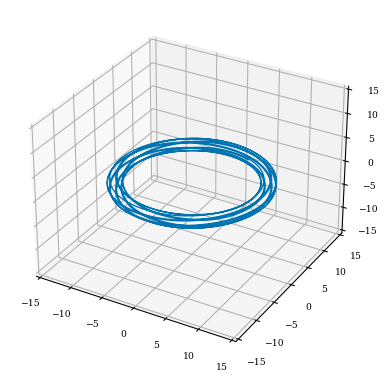

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import Grid, LinearGrid
from desc.plotting import plot_3d
import plotly.graph_objects as go

eq_file = "equilibria/input.LandremanPaul2021_QA_scaled_output.h5"

def data_input_from_file(file_name):
    # Initialize empty lists to store the separated columns
    psi = []
    theta = []
    zeta = []
    vpar = []

    # Open the file for reading
    with open(file_name, 'r') as file:
        # Read the first line (column headers) and discard it
        file.readline()

        # Read the data row by row
        for line in file:
            # Split the line into columns using tab as the delimiter
            columns = line.strip().split('\t')

            # Convert each column to the appropriate data type and append to the respective lists
            psi.append(float(columns[0]))
            theta.append(float(columns[1]))
            zeta.append(float(columns[2]))
            vpar.append(float(columns[3]))

    psi = np.array(psi)
    theta = np.array(theta)
    zeta = np.array(zeta)
    vpar = np.array(vpar)
    
    return np.array([psi, theta, zeta, vpar]).T

solution = data_input_from_file("solution_input.LandremanPaul2021.txt")

#Assumindo que isto está bem feito (não sei se o Psi está certo, dá valores muito mais altos do que eu esperava)
def boozer_to_cylindrical(eq_filename, solution=None):
    eq = desc.io.load(eq_filename)
    eq._iota = eq.get_profile("iota").to_powerseries(order=eq.L, sym=True)
    eq._current = None

    grid = Grid([1, 0, 0], sort=False)
    data = eq.compute(["Psi", "R"], grid = grid)
    Psi = data["Psi"][0]
    R = data["R"][0]
    
    solution[:, 0] = np.sqrt(solution[:, 0]*(Psi/2*np.pi)) # un-normalizing psi
    theta = solution[:, 1]
    zeta = solution[:, 2]

    cylindric = np.ndarray(shape=solution.shape)
    
    cylindric[:, 0] = R + solution[:, 0]*np.cos(solution[:, 1])
    cylindric[:, 1] = solution[:, 2]     
    cylindric[:, 2] = solution[:, 0]*np.sin(solution[:, 1])
    return cylindric

def boozer_to_cartesian(eq_filename, solution=None):
    eq = desc.io.load(eq_filename)
    eq._iota = eq.get_profile("iota").to_powerseries(order=eq.L, sym=True)
    eq._current = None

    grid = Grid([1, 0, 0], sort=False)
    data = eq.compute(["Psi", "R"], grid = grid)
    Psi = data["Psi"][0]
    R = data["R"][0]
    
    solution[:, 0] = np.sqrt(solution[:, 0]*(Psi/2*np.pi)) # un-normalizing psi
    theta = solution[:, 1]
    zeta = solution[:, 2]

    cylindric = np.ndarray(shape=solution.shape)
    
    cylindric[:, 0] = R + solution[:, 0]*np.cos(solution[:, 1])
    cylindric[:, 1] = solution[:, 2]     
    cylindric[:, 2] = solution[:, 0]*np.sin(solution[:, 1])

    x = np.ndarray(shape=cylindric.shape)
 
    x[:, 0] = cylindric[:, 0]*np.sin(cylindric[:, 1])
    x[:, 1] = cylindric[:, 0]*np.cos(cylindric[:, 1])
    x[:, 2] = cylindric[:, 2]

    return x

def plot_tracing_in_surface(eq_filename, x):
    eq = desc.io.load(eq_filename)[-1]
    eq._iota = eq.get_profile("iota").to_powerseries(order=eq.L, sym=True)
    eq._current = None
    grid = LinearGrid(rho=np.sqrt(0.2), M = 100, N = 100)
    fig = plot_3d(eq, "B", alpha=0.5, grid=grid)
    fig.add_trace(
    go.scatter3d(x=x[:, 0], y=x[:, 1], z=x[:, 2], mode='markers'))


x = boozer_to_cartesian("equilibria/ellipse_higherPsi.h5", solution)

ax = plt.figure().add_subplot(projection='3d')

# Prepare arrays x, y, z

ax.plot(x[:, 0], x[:, 1], x[:, 2])
ax.set_xlim(-15, 15)
ax.set_ylim(-15, 15)
ax.set_zlim(-15, 15)

plt.show()

In [3]:
eq = desc.io.load(eq_file)[-1]
eq._iota = eq.get_profile("iota").to_powerseries(order=eq.L, sym=True)
eq._current = None
grid = LinearGrid(rho=np.sqrt(0.2), M = 100, N = 100)
fig = plot_3d(eq, "B", alpha=0.5, grid=grid)
fig.add_trace(go.Scatter3d(x=x[:, 0], y=x[:, 1], z=x[:, 2], mode='markers'))

/home/joaobiu/DESC/desc/io/hdf5_io.py:125: RuntimeWarning:

Save attribute '_anisotropy' was not loaded.

